# PLEASE CLONE THIS NOTEBOOK INTO YOUR PERSONAL FOLDER
# DO NOT RUN CODE IN THE SHARED FOLDER

In [0]:
from pyspark.sql.functions import col
import matplotlib.pyplot as plt
import numpy as np

from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score

In [0]:
#setting blob container variables
blob_container = "newteam9" # The name of your container created in https://portal.azure.com
storage_account = "newteam9" # The name of your Storage account created in https://portal.azure.com
secret_scope = "te9" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "a" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)

In [0]:
# Inspect the Mount's Final Project folder 
display(dbutils.fs.ls("/mnt/mids-w261/datasets_final_project"))

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/airlines/,airlines/,0
dbfs:/mnt/mids-w261/datasets_final_project/airlines_data/,airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/,parquet_airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0
dbfs:/mnt/mids-w261/datasets_final_project/stations_data/,stations_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/,weather_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_6_hr/,weather_data_6_hr/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_single/,weather_data_single/,0


In [0]:
# Load 2015 Q1 & Q2 for Flights
df_airlines = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/")
display(df_airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2015,2,4,23,4,2015-04-23,AA,19805,AA,N3FJAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1202,-8.0,0.0,0.0,-1,1200-1259,15.0,1217,1356,6.0,1414,1402,-12.0,0.0,0.0,-1,1400-1459,0.0,null,0.0,244.0,240.0,219.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,24,5,2015-04-24,AA,19805,AA,N3BAAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1214,4.0,4.0,0.0,0,1200-1259,19.0,1233,1417,12.0,1414,1429,15.0,15.0,1.0,1,1400-1459,0.0,null,0.0,244.0,255.0,224.0,1.0,1440.0,6,0.0,0.0,15.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,25,6,2015-04-25,AA,19805,AA,N3CUAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1254,44.0,44.0,1.0,2,1200-1259,24.0,1318,1441,4.0,1414,1445,31.0,31.0,1.0,2,1400-1459,0.0,null,0.0,244.0,231.0,203.0,1.0,1440.0,6,31.0,0.0,0.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,26,7,2015-04-26,AA,19805,AA,N3HKAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1205,-5.0,0.0,0.0,-1,1200-1259,11.0,1216,1326,4.0,1414,1330,-44.0,0.0,0.0,-2,1400-1459,0.0,null,0.0,244.0,205.0,190.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,27,1,2015-04-27,AA,19805,AA,N3DMAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1219,9.0,9.0,0.0,0,1200-1259,11.

In [0]:
# Load the 2015 Q1 for Weather
df_weather = spark.read.parquet("/mnt/mids-w261/datasets_final_project/weather_data/*").filter(col('DATE') < "2015-07-01T00:00:00.000")
display(df_weather)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3
3809099999,2015-01-01T00:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0077,1","00240,1,C,N","008000,1,9,9","+0113,1","+0099,1","10306,1",,"01,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00360,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00180,1,99,9,99,9",,,"99999,9,10213,1","3,1,002,1,+999,9","51,1",,,"3,99,0144,1,999","4,99,0134,1,999",SYN10603809 11358 82015 10113 20099 30213 40306 53002 69901 75165 887// 333 81706 85708 88712 90710 91128 91026=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,"06,0000,2,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"6,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T00:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0077,1","00183,1,C,N","008000,1,9,9","+0110,1","+0100,1","99999,9",,"02,1,+00122,1,99,9","04,1,+00183,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00122,1,99,9,99,9",,,"10290,1,99999,9",,"51,1",,,,,MET079METAR EGDR 010050Z 21015KT 8000 -DZ FEW004 SCT006 OVC010 11/10 Q1029 YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"210,1,N,0077,1","00300,1,9,N","008000,1,9,9","+0113,1","+0101,1","10300,1",,"01,1,+00120,1,07,1","03,1,+00180,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00120,1,99,9,99,9",,,"99999,9,10206,1","8,1,004,1,+999,9","51,1",,,"3,99,0134,1,999",,SYN09403809 41258 82115 10113 20101 30206 40300 58004 75155 887// 333 81704 83706 88710 90710 91126=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"200,1,N,0082,1","00244,1,9,N","008000,1,9,9","+0120,1","+0100,1","99999,9",,"04,1,+00183,1,99,9","07,1,+00244,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,00183,1,99,9,99,9",,,"10290,1,99999,9",,"05,1",,"0144,1",,,MET086METAR EGDR 010150Z 20016G28KT 8000 HZ SCT006 BKN008 OVC010 12/10 Q1029 REDZ YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0082,1","00240,1,C,N","008000,1,9,9","+0115,1","+0100,1","10294,1",,"03,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,03,1,99,9,00180,1,99,9,99,9",,,"99999,9,10201,1","8,1,008,1,+999,9","20,1",,,"3,99,0149,1,999","4,99,0144,1,999",SYN10003809 41358 82016 10115 20100 30201 40294 58008 72052 886// 333 83706 85708 88710 90710 91129 91028=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"2,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0093,1","00122,1,9,N","006000,1

In [0]:
df_weather.columns

Out[24]: ['STATION',
 'DATE',
 'SOURCE',
 'LATITUDE',
 'LONGITUDE',
 'ELEVATION',
 'NAME',
 'REPORT_TYPE',
 'CALL_SIGN',
 'QUALITY_CONTROL',
 'WND',
 'CIG',
 'VIS',
 'TMP',
 'DEW',
 'SLP',
 'AW1',
 'GA1',
 'GA2',
 'GA3',
 'GA4',
 'GE1',
 'GF1',
 'KA1',
 'KA2',
 'MA1',
 'MD1',
 'MW1',
 'MW2',
 'OC1',
 'OD1',
 'OD2',
 'REM',
 'EQD',
 'AW2',
 'AX4',
 'GD1',
 'AW5',
 'GN1',
 'AJ1',
 'AW3',
 'MK1',
 'KA4',
 'GG3',
 'AN1',
 'RH1',
 'AU5',
 'HL1',
 'OB1',
 'AT8',
 'AW7',
 'AZ1',
 'CH1',
 'RH3',
 'GK1',
 'IB1',
 'AX1',
 'CT1',
 'AK1',
 'CN2',
 'OE1',
 'MW5',
 'AO1',
 'KA3',
 'AA3',
 'CR1',
 'CF2',
 'KB2',
 'GM1',
 'AT5',
 'AY2',
 'MW6',
 'MG1',
 'AH6',
 'AU2',
 'GD2',
 'AW4',
 'MF1',
 'AA1',
 'AH2',
 'AH3',
 'OE3',
 'AT6',
 'AL2',
 'AL3',
 'AX5',
 'IB2',
 'AI3',
 'CV3',
 'WA1',
 'GH1',
 'KF1',
 'CU2',
 'CT3',
 'SA1',
 'AU1',
 'KD2',
 'AI5',
 'GO1',
 'GD3',
 'CG3',
 'AI1',
 'AL1',
 'AW6',
 'MW4',
 'AX6',
 'CV1',
 'ME1',
 'KC2',
 'CN1',
 'UA1',
 'GD5',
 'UG2',
 'AT3',
 'AT4',
 'GJ1',
 'MV1',
 'GA5',
 'CT2',
 'CG2',
 'ED1',
 'AE1',
 'CO1',
 'KE1',
 'KB1',
 'AI4',
 'MW3',
 'KG2',
 'AA2',
 'AX2',
 'AY1',
 'RH2',
 'OE2',
 'CU3',
 'MH1',
 'AM1',
 'AU4',
 'GA6',
 'KG1',
 'AU3',
 'AT7',
 'KD1',
 'GL1',
 'IA1',
 'GG2',
 'OD3',
 'UG1',
 'CB1',
 'AI6',
 'CI1',
 'CV2',
 'AZ2',
 'AD1',
 'AH1',
 'WD1',
 'AA4',
 'KC1',
 'IA2',
 'CF3',
 'AI2',
 'AT1',
 'GD4',
 'AX3',
 'AH4',
 'KB3',
 'CU1',
 'CN4',
 'AT2',
 'CG1',
 'CF1',
 'GG1',
 'MV2',
 'CW1',
 'GG4',
 'AB1',
 'AH5',
 'CN3']

In [0]:
#read in stations dataset from parquet file
df_stations = spark.read.parquet("/mnt/mids-w261/datasets_final_project/stations_data/*")
display(df_stations)

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690020,93218,69002093218,36.0,-121.233,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,55.73024537916726
690020,93218,69002093218,36.0,-121.233,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,255.49106220353934
690020,93218,69002093218,36.0,-121.233,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.65,2750.4353299559803
690020,93218,69002093218,36.0,-121.233,70045027512,LONELY,AK,LNI,70.917,-153.25,2676.3554370627153
690020,93218,69002093218,36.0,-121.233,70063027403,OLIKTOK POW 2,AK,POLI,70.5,-149.883,2604.050248854232
690020,93218,69002093218,36.0,-121.233,70063526465,GALBRAITH LAKE AIRPORT,AK,PAGB,68.479,-149.49,2490.9756094472277
690020,93218,69002093218,36.0,-121.233,70063627405,PRUDHOE BAY,AK,PAUD,70.25,-148.333,2568.180281844432
690020,93218,69002093218,36.0,-121.233,70104626418,CENTRAL AIRPORT,AK,PACE,65.567,-144.765,2254.5584891291946
690020,93218,69002093218,36.0,-121.233,70119526625,SHISHMAREF/NEW AIRPORT,AK,PASH,66.25,-166.089,2743.6881828292408


In [0]:
#group stations table by station_id and get the 'max' latitude and longitude. There's multiple records for each station_id (one for each 'neighbor station') so record counts get crazy if we don't do this
df_stations_lkp = df_stations.groupBy('station_id').max('lat','lon').withColumnRenamed('max(lat)','lat').withColumnRenamed('max(lon)','lon')
df_stations_lkp.display()

#upload to blob storage
df_stations_lkp.write.mode('overwrite').parquet(f"{blob_url}/df_stations_lkp")

station_id,lat,lon
70275546404,61.437,-142.904
72224503882,30.212,-85.683
72226613850,32.35,-86.983
70104526649,68.031,-162.903
72074924255,48.35,-122.667
72213653883,31.259,-81.466
72455013947,39.05,-96.767
72637594817,42.665,-83.418
72090400299,29.067,-81.283
72744904954,46.419,-92.804


In [0]:
#create random sample of tables for testing, change later once testing is done
subset_w = df_weather.sample(.3,42)
subset_a = df_airlines.sample(.3,55)
, START 
#write subset to blob storage
subset_w.write.mode('overwrite').parquet(f"{blob_url}/subset_w")
subset_a.write.mode('overwrite').parquet(f"{blob_url}/subset_a2")

In [0]:
#read from blob
subset_a = spark.read.parquet(f"{blob_url}/subset_a")
subset_w = spark.read.parquet(f"{blob_url}/subset_w")
df_stations = spark.read.parquet(f"{blob_url}/df_stations_lkp")

In [0]:
#add hour column to weather table (round down to nearest hour) used for joining to airline table
#2015-01-04T15:00:00.000+0000
from pyspark.sql.functions import *
import pyspark.sql.functions as F
subset_w = subset_w.withColumn("obs_hour", from_unixtime(unix_timestamp(col("DATE"),"yyyy-MM-dd hh:mm:ss"),"hh"))
subset_w = subset_w.withColumn("plain_date", from_unixtime(unix_timestamp(col("DATE"),"yyyy-MM-dd hh:mm:ss"),"yyyy-MM-dd"))

In [0]:
#don't rerun (or if you do rerun the command to read in from blob)
#Remove "K" prefix for joining
subset_w= subset_w.withColumn("plain_call_sign", when(subset_w.CALL_SIGN.substr(1,1)=='K',subset_w.CALL_SIGN.substr(2,20)).otherwise(subset_w.CALL_SIGN))

subset_w.select('plain_call_sign').distinct().collect()

Out[183]: [Row(plain_call_sign='TJNR '),
 Row(plain_call_sign='SLH '),
 Row(plain_call_sign='PALJ '),
 Row(plain_call_sign='CTJ '),
 Row(plain_call_sign='IIY '),
 Row(plain_call_sign='2I0 '),
 Row(plain_call_sign='TJIG '),
 Row(plain_call_sign='AFP '),
 Row(plain_call_sign='PATO '),
 Row(plain_call_sign='7R3 '),
 Row(plain_call_sign='PAPO '),
 Row(plain_call_sign='CPT '),
 Row(plain_call_sign='PABA '),
 Row(plain_call_sign='PAJC '),
 Row(plain_call_sign='1A6 '),
 Row(plain_call_sign='PAII '),
 Row(plain_call_sign='PAIK '),
 Row(plain_call_sign='SFD '),
 Row(plain_call_sign='HLX '),
 Row(plain_call_sign='LUM '),
 Row(plain_call_sign='DPA '),
 Row(plain_call_sign='VTI '),
 Row(plain_call_sign='PATG '),
 Row(plain_call_sign='SPR '),
 Row(plain_call_sign='1F0 '),
 Row(plain_call_sign='HRX '),
 Row(plain_call_sign='PAEI '),
 Row(plain_call_sign='ASH '),
 Row(plain_call_sign='PASA '),
 Row(plain_call_sign='ANQ '),
 Row(plain_call_sign='PAWI '),
 Row(plain_call_sign='LHB '),
 Row(plain_call_sign='AXS '),
 Row(plain_call_sign='LNP '),
 Row(plain_call_sign='I75 '),
 Row(plain_call_sign='BEA '),
 Row(plain_call_sign='ROA '),
 Row(plain_call_sign='CLK '),
 Row(plain_call_sign='PAKV '),
 Row(plain_call_sign='QTM '),
 Row(plain_call_sign='AIB '),
 Row(plain_call_sign='PASL '),
 Row(plain_call_sign='PAFR '),
 Row(plain_call_sign='CFD '),
 Row(plain_call_sign='0CO '),
 Row(plain_call_sign='5R8 '),
 Row(plain_call_sign='PFNO '),
 Row(plain_call_sign='RSV '),
 Row(plain_call_sign='GZL '),
 Row(plain_call_sign='PAHP '),
 Row(plain_call_sign='6B0 '),
 Row(plain_call_sign='40J '),
 Row(plain_call_sign='E11 '),
 Row(plain_call_sign='ORD '),
 Row(plain_call_sign='PAIN '),
 Row(plain_call_sign='JES '),
 Row(plain_call_sign='PARY '),
 Row(plain_call_sign='PNA '),
 Row(plain_call_sign='ADF '),
 Row(plain_call_sign='EMM '),
 Row(plain_call_sign='PEZ '),
 Row(plain_call_sign='SAA '),
 Row(plain_call_sign='CMI '),
 Row(plain_call_sign='PALU '),
 Row(plain_call_sign='PANW '),
 Row(plain_call_sign='BBP '),
 Row(plain_call_sign='PASH '),
 Row(plain_call_sign='CBE '),
 Row(plain_call_sign='PASY '),
 Row(plain_call_sign='PAEM '),
 Row(plain_call_sign='LYH '),
 Row(plain_call_sign='ACP '),
 Row(plain_call_sign='PABR '),
 Row(plain_call_sign='VSH '),
 Row(plain_call_sign='DVN '),
 Row(plain_call_sign='OZA '),
 Row(plain_call_sign='PAKU '),
 Row(plain_call_sign='0E0 '),
 Row(plain_call_sign='LUD '),
 Row(plain_call_sign='RCE '),
 Row(plain_call_sign='PASK '),
 Row(plain_call_sign='TIST '),
 Row(plain_call_sign='MZZ '),
 Row(plain_call_sign='JYL '),
 Row(plain_call_sign='BDH '),
 Row(plain_call_sign='PAUN '),
 Row(plain_call_sign='HOE '),
 Row(plain_call_sign='PSF '),
 Row(plain_call_sign='JGG '),
 Row(plain_call_sign='CPS '),
 Row(plain_call_sign='U19 '),
 Row(plain_call_sign='OOA '),
 Row(plain_call_sign='GBK '),
 Row(plain_call_sign='PAMD '),
 Row(plain_call_sign='JSO '),
 Row(plain_call_sign='BBG '),
 Row(plain_call_sign='PAGB '),
 Row(plain_call_sign='OLE '),
 Row(plain_call_sign='1J0 '),
 Row(plain_call_sign='PADK '),
 Row(plain_call_sign='PAIL '),
 Row(plain_call_sign='PAHO '),
 Row(plain_call_sign='PKWA '),
 Row(plain_call_sign='SZT '),
 Row(plain_call_sign='BPC '),
 Row(plain_call_sign='20V '),
 Row(plain_call_sign='UNI '),
 Row(plain_call_sign='PASC '),
 Row(plain_call_sign='MLJ '),
 Row(plain_call_sign='PAMY '),
 Row(plain_call_sign='NBT '),
 Row(plain_call_sign='GTB '),
 Row(plain_call_sign='STO '),
 Row(plain_call_sign='ROC '),
 Row(plain_call_sign='INJ '),
 Row(plain_call_sign='PACZ '),
 Row(plain_call_sign='PADU '),
 Row(plain_call_sign='BKN '),
 Row(plain_call_sign='3J7 '),
 Row(plain_call_sign='1A5 '),
 Row(plain_call_sign='PAPM '),
 Row(plain_call_sign='3T5 '),
 Row(plain_call_sign='TISX '),
 Row(plain_call_sign='IKW '),
 Row(plain_call_sign='JWY '),
 Row(plain_call_sign='ARR '),
 Row(plain_call_sign='AEJ '),
 Row(plain_call_sign='PASM '),
 Row(plain_call_sign='6R3 '),
 Row(plain_call_sign='XLL '),
 Row(plain_call_sign='CUH '),
 Row(plain_call_s

In [0]:
### Remove leading and trailing space of plain_call_sign column in weather data
subset_w = subset_w.withColumn('plain_call_sign', trim(subset_w.plain_call_sign))

subset_w.select('plain_call_sign').distinct().collect()

Out[184]: [Row(plain_call_sign='JWY'),
 Row(plain_call_sign='CXM'),
 Row(plain_call_sign='RPH'),
 Row(plain_call_sign='GGI'),
 Row(plain_call_sign='4A9'),
 Row(plain_call_sign='3J7'),
 Row(plain_call_sign='ASH'),
 Row(plain_call_sign='QTM'),
 Row(plain_call_sign='PAPO'),
 Row(plain_call_sign='NBT'),
 Row(plain_call_sign='2I0'),
 Row(plain_call_sign='EMM'),
 Row(plain_call_sign='6R3'),
 Row(plain_call_sign='SBD'),
 Row(plain_call_sign='PAGM'),
 Row(plain_call_sign='PADK'),
 Row(plain_call_sign='CPT'),
 Row(plain_call_sign='PASY'),
 Row(plain_call_sign='PAHO'),
 Row(plain_call_sign='LUM'),
 Row(plain_call_sign='IAG'),
 Row(plain_call_sign='PANW'),
 Row(plain_call_sign='ANQ'),
 Row(plain_call_sign='HOE'),
 Row(plain_call_sign='CCA'),
 Row(plain_call_sign='MZZ'),
 Row(plain_call_sign='PAMD'),
 Row(plain_call_sign='GZL'),
 Row(plain_call_sign='PSF'),
 Row(plain_call_sign='BVE'),
 Row(plain_call_sign='HSP'),
 Row(plain_call_sign='RCE'),
 Row(plain_call_sign='2G4'),
 Row(plain_call_sign='PAMY'),
 Row(plain_call_sign='GTB'),
 Row(plain_call_sign='IIY'),
 Row(plain_call_sign='PLU'),
 Row(plain_call_sign='CFD'),
 Row(plain_call_sign='MLJ'),
 Row(plain_call_sign='PAMM'),
 Row(plain_call_sign='FBR'),
 Row(plain_call_sign='OLE'),
 Row(plain_call_sign='DVN'),
 Row(plain_call_sign='HLX'),
 Row(plain_call_sign='CLK'),
 Row(plain_call_sign='EMK'),
 Row(plain_call_sign='BBG'),
 Row(plain_call_sign='PARY'),
 Row(plain_call_sign='PATQ'),
 Row(plain_call_sign='PASC'),
 Row(plain_call_sign='AJZ'),
 Row(plain_call_sign='TIST'),
 Row(plain_call_sign='VSH'),
 Row(plain_call_sign='LYH'),
 Row(plain_call_sign='SAR'),
 Row(plain_call_sign='PAPM'),
 Row(plain_call_sign='PSK'),
 Row(plain_call_sign='5R8'),
 Row(plain_call_sign='INJ'),
 Row(plain_call_sign='OOA'),
 Row(plain_call_sign='W43'),
 Row(plain_call_sign='3R7'),
 Row(plain_call_sign='PACZ'),
 Row(plain_call_sign='JYL'),
 Row(plain_call_sign='TJIG'),
 Row(plain_call_sign='PAKW'),
 Row(plain_call_sign='LNP'),
 Row(plain_call_sign='SZT'),
 Row(plain_call_sign='PATC'),
 Row(plain_call_sign='PADG'),
 Row(plain_call_sign='PAHP'),
 Row(plain_call_sign='DPA'),
 Row(plain_call_sign='PANV'),
 Row(plain_call_sign='RMN'),
 Row(plain_call_sign='SPR'),
 Row(plain_call_sign='BDH'),
 Row(plain_call_sign='PATO'),
 Row(plain_call_sign='PASH'),
 Row(plain_call_sign='7R3'),
 Row(plain_call_sign='JGG'),
 Row(plain_call_sign='PAEI'),
 Row(plain_call_sign='I75'),
 Row(plain_call_sign='AIB'),
 Row(plain_call_sign='SFD'),
 Row(plain_call_sign='PAKT'),
 Row(plain_call_sign='CMI'),
 Row(plain_call_sign='PANT'),
 Row(plain_call_sign='PAKI'),
 Row(plain_call_sign='PALU'),
 Row(plain_call_sign='AVC'),
 Row(plain_call_sign='PAIK'),
 Row(plain_call_sign='HSB'),
 Row(plain_call_sign='LOM'),
 Row(plain_call_sign='PALJ'),
 Row(plain_call_sign='PAKU'),
 Row(plain_call_sign='DEQ'),
 Row(plain_call_sign='PFNO'),
 Row(plain_call_sign='CTJ'),
 Row(plain_call_sign='PABR'),
 Row(plain_call_sign='PNA'),
 Row(plain_call_sign='PAEM'),
 Row(plain_call_sign='ROA'),
 Row(plain_call_sign='JAS'),
 Row(plain_call_sign='PAIL'),
 Row(plain_call_sign='PAII'),
 Row(plain_call_sign='IPN'),
 Row(plain_call_sign='PAKV'),
 Row(plain_call_sign='PTTP'),
 Row(plain_call_sign='PAJZ'),
 Row(plain_call_sign='TISX'),
 Row(plain_call_sign='40J'),
 Row(plain_call_sign='1A5'),
 Row(plain_call_sign='VTI'),
 Row(plain_call_sign='PASK'),
 Row(plain_call_sign='MHT'),
 Row(plain_call_sign='TJNR'),
 Row(plain_call_sign='3T5'),
 Row(plain_call_sign='BPC'),
 Row(plain_call_sign='PADM'),
 Row(plain_call_sign='LUD'),
 Row(plain_call_sign='SAA'),
 Row(plain_call_sign='STO'),
 Row(plain_call_sign='GUL'),
 Row(plain_call_sign='SLH'),
 Row(plain_call_sign='PABA'),
 Row(plain_call_sign='PAFR'),
 Row(plain_call_sign='11R'),
 Row(plain_call_sign='55N'),
 Row(plain_call_sign='1J0'),
 Row(plain_call_sign='AFP'),
 Row(plain_call_sign='AEJ'),
 Row(plain_call_sign='OZA'),
 Row(plain_call_sign='DEC'),
 Row(plain_call_sign='ARR'),
 Row(plain_call_sign='BCB'),
 Row(plain_call_sign='AXS'),
 

In [0]:
#subset of weather data count
subset_w.count()

Out[185]: 16741347

In [0]:
#Dont rerun unless you change subset_w
subset_w.display(10)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,obs_hour,plain_date,plain_call_sign
47739099999,2015-01-01T00:00:00.000+0000,4,34.8,138.1833333,135.0,"SHIZUOKA AIRPORT, JA",FM-15,99999,V020,"260,1,N,0098,1","99999,9,9,N","009999,1,9,9","+0040,1","-0030,1","99999,9",,"02,1,+00610,1,99,9",,,,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00610,1,99,9,99,9",,,"10040,1,99999,9",,,,,,,MET069METAR RJNS 010000Z 26019KT 9999 FEW020 04/M03 Q1004 RMK 1CU020 A2967=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,12,2015-01-01,99999
47739099999,2015-01-01T01:00:00.000+0000,4,34.8,138.1833333,135.0,"SHIZUOKA AIRPORT, JA",FM-15,99999,V020,"260,1,N,0108,1","99999,9,9,N","009999,1,9,9","+0040,1","-0030,1","99999,9",,"02,1,+00610,1,99,9",,,,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00610,1,99,9,99,9",,,"10040,1,99999,9",,,,"0165,1",,,MET072METAR RJNS 010100Z 26021G32KT 9999 FEW020 04/M03 Q1004 RMK 1CU020 A2967=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,01,2015-01-01,99999
47739099999,2015-01-01T02:02:00.000+0000,4,34.8,138.1833333,135.0,"SHIZUOKA AIRPORT, JA",FM-16,99999,V020,"260,1,N,0118,1","99999,9,9,N","009999,1,9,9","+0050,1","-0050,1","99999,9",,"02,1,+00610,1,99,9",,,,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00610,1,99,9,99,9",,,"10030,1,99999,9",,,,"0170,1",,,MET072SPECI RJNS 010202Z 26023G33KT 9999 FEW020 05/M05 Q1003 RMK 2CU020 A2964=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,02,2015-01-01,99999
47739099999,2015-01-01T03:04:00.000+0000,4,34.8,138.1833333,135.0,"SHIZUOKA AIRPORT, JA",FM-16,99999,V020,"270,1,N,0103,1","01372,1,C,N","009999,1,9,9","+0060,1","-0090,1","99999,9",,"02,1,+00610,1,99,9","04,1,+01372,1,99,9",,,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00610,1,99,9,99,9",,,"10020,1,99999,9",,,,"0154,1",,,MET091SPECI RJNS 010304Z 27020G30KT 9999 FEW020 SCT045 06/M09 Q1002 RMK 1CU020 3CU045 A2959=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,03,2015-01-01,99999
47739099999,2015-01-01T06:00:00.000+0000,4,34.8,138.1833333,135.0,"SHIZUOKA AIRPORT, JA",FM-15,99999,V020,"280,1,N,0124,1","99999,9,9,N","009999,1,9,9","+0030,1","-0070,1","99999,9",,"02,1,+00914,1,99,9",,,,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00914,1,99,9,99,9",,,"10020,1,99999,9",,,,"0185,1",,,MET072METAR RJNS 010600Z 28024G36KT 9999 FEW030 03/M07 Q1002 RMK 1CU030 A2959=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,06,2015-01-01,99999
47739099999,2015-01-01T08:00:00.000+0000,4,34.8,138.1833333,135.0,"SHIZUOKA AIRPORT, JA",FM-15,99999,V020,"270,1,N,0067,1","99999,9,9,N","009999,1,9,9","+0010,1","-0060,1","99999,9",,"02,1,+00762,1,99,9",,,,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00762,1,99,9,99,9",,,"10030,1,99999,9",,,,,,,MET069METAR RJNS 010800Z 27013KT 9999 FEW025 01/M06 Q1003 RMK 1CU025 A2963=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

In [0]:
#subset of weather data count ater filtering for one report type
subset_w.count()

Out[187]: 16741347

In [0]:
#listing out column names and types
subset_w.columns

Out[188]: ['STATION',
 'DATE',
 'SOURCE',
 'LATITUDE',
 'LONGITUDE',
 'ELEVATION',
 'NAME',
 'REPORT_TYPE',
 'CALL_SIGN',
 'QUALITY_CONTROL',
 'WND',
 'CIG',
 'VIS',
 'TMP',
 'DEW',
 'SLP',
 'AW1',
 'GA1',
 'GA2',
 'GA3',
 'GA4',
 'GE1',
 'GF1',
 'KA1',
 'KA2',
 'MA1',
 'MD1',
 'MW1',
 'MW2',
 'OC1',
 'OD1',
 'OD2',
 'REM',
 'EQD',
 'AW2',
 'AX4',
 'GD1',
 'AW5',
 'GN1',
 'AJ1',
 'AW3',
 'MK1',
 'KA4',
 'GG3',
 'AN1',
 'RH1',
 'AU5',
 'HL1',
 'OB1',
 'AT8',
 'AW7',
 'AZ1',
 'CH1',
 'RH3',
 'GK1',
 'IB1',
 'AX1',
 'CT1',
 'AK1',
 'CN2',
 'OE1',
 'MW5',
 'AO1',
 'KA3',
 'AA3',
 'CR1',
 'CF2',
 'KB2',
 'GM1',
 'AT5',
 'AY2',
 'MW6',
 'MG1',
 'AH6',
 'AU2',
 'GD2',
 'AW4',
 'MF1',
 'AA1',
 'AH2',
 'AH3',
 'OE3',
 'AT6',
 'AL2',
 'AL3',
 'AX5',
 'IB2',
 'AI3',
 'CV3',
 'WA1',
 'GH1',
 'KF1',
 'CU2',
 'CT3',
 'SA1',
 'AU1',
 'KD2',
 'AI5',
 'GO1',
 'GD3',
 'CG3',
 'AI1',
 'AL1',
 'AW6',
 'MW4',
 'AX6',
 'CV1',
 'ME1',
 'KC2',
 'CN1',
 'UA1',
 'GD5',
 'UG2',
 'AT3',
 'AT4',
 'GJ1',
 'MV1',
 'GA5',
 'CT2',
 'CG2',
 'ED1',
 'AE1',
 'CO1',
 'KE1',
 'KB1',
 'AI4',
 'MW3',
 'KG2',
 'AA2',
 'AX2',
 'AY1',
 'RH2',
 'OE2',
 'CU3',
 'MH1',
 'AM1',
 'AU4',
 'GA6',
 'KG1',
 'AU3',
 'AT7',
 'KD1',
 'GL1',
 'IA1',
 'GG2',
 'OD3',
 'UG1',
 'CB1',
 'AI6',
 'CI1',
 'CV2',
 'AZ2',
 'AD1',
 'AH1',
 'WD1',
 'AA4',
 'KC1',
 'IA2',
 'CF3',
 'AI2',
 'AT1',
 'GD4',
 'AX3',
 'AH4',
 'KB3',
 'CU1',
 'CN4',
 'AT2',
 'CG1',
 'CF1',
 'GG1',
 'MV2',
 'CW1',
 'GG4',
 'AB1',
 'AH5',
 'CN3',
 'obs_hour',
 'plain_date',
 'plain_call_sign']

In [0]:
#get hour (round down) from CRS_DEP_TIME in new column airline data

#first need to convert timestamp format
subset_a = subset_a.withColumn("time_string", F.format_string("%04d", F.col("CRS_DEP_TIME")))\
    .withColumn(
        "time_string",
        F.concat_ws(
            ":",
            F.array(
                [
                    F.substring(
                        "time_string",
                        1,
                        2
                    ),
                    F.substring(
                        "time_string",
                        3,
                        2
                    ),
                    F.lit("00")
                ]
            )
        )
    )\
    .withColumn("time_string", F.concat(F.lit("2018-01-01 "), F.col("time_string")))

#now can parse out the hour
subset_a = subset_a.withColumn("dept_hour", from_unixtime(unix_timestamp(col("time_string"),"yyyy-MM-dd HH:mm:ss"),"hh"))

In [0]:
#Dont rerun unless you change subset_a
subset_a.display(10)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,time_string,dept_hour
2015,2,4,30,4,2015-04-30,AA,19805,AA,N3JTAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1256,46.0,46.0,1.0,3,1200-1259,14.0,1310,1416,7.0,1414,1423,9.0,9.0,0.0,0,1400-1459,0.0,null,0.0,244.0,207.0,186.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2018-01-01 12:10:00,12
2015,2,4,9,4,2015-04-09,AA,19805,AA,N569AA,168,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14492,1449202,34492,RDU,"Raleigh/Durham, NC",NC,37,North Carolina,36,1506,null,null,null,null,null,1500-1559,null,null,null,null,1808,null,null,null,null,null,1800-1859,1.0,B,0.0,122.0,null,null,1.0,646.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2018-01-01 15:06:00,03
2015,2,4,11,6,2015-04-11,AA,19805,AA,N468AA,168,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14492,1449202,34492,RDU,"Raleigh/Durham, NC",NC,37,North Carolina,36,1506,1506,0.0,0.0,0.0,0,1500-1559,12.0,1518,1743,29.0,1808,1812,4.0,4.0,0.0,0,1800-1859,0.0,null,0.0,122.0,126.0,85.0,1.0,646.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2018-01-01 15:06:00,03
2015,2,4,13,1,2015-04-13,AA,19805,AA,N513AA,87,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14570,1457002,34570,RNO,"Reno, NV",NV,32,Nevada,85,2030,2048,18.0,18.0,1.0,1,2000-2059,16.0,2104,2250,9.0,2257,2259,2.0,2.0,0.0,0,2200-2259,0.0,null,0.0,267.0,251.0,226.0,1.0,1671.0,7,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2018-01-01 20:30:00,08
2015,2,4,21,2,2015-04-21,AA,19805,AA,N508AA,87,13930,13

In [0]:
#checking distinct values for joining column
subset_a.select('ORIGIN').distinct().collect()

Out[192]: [Row(ORIGIN='ATL'), Row(ORIGIN='ORD')]

In [0]:
#num rows in airline data
subset_a.count()

Out[193]: 33674

In [0]:
#num rows in weather data
subset_w.count()

Out[194]: 16741347

In [0]:
#num rows in stations
df_stations.count()

Out[195]: 2237

In [0]:
#list of stations table columns
df_stations.columns

Out[196]: ['station_id', 'lat', 'lon']

In [0]:
#Join weather and stations (inner join)
join_ws = subset_w.join(df_stations,(subset_w.STATION==df_stations.station_id),'inner')
#when we do a left join (with weather on the left) we have a lot of nulls for our station columns, this means that the station_id isnt matching with the weahter STATION field. If we do an inner join we only get records where we have the station_id in both tables

In [0]:
join_ws.display(10)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,obs_hour,plain_date,plain_call_sign,station_id,lat,lon
78526500494,2015-01-01T10:55:00.000+0000,7,18.45677,-66.09847,3.0,"FERNANDO LUIS RIBAS DOMINICCI AIRPORT, PR US",FM-15,TJIG,V020,"140,5,N,0026,5","22000,5,9,N","016093,5,N,5","+0240,C","+0220,C","99999,9",,"04,5,+01219,5,99,9",,,,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,01219,1,99,9,99,9",,,"10200,5,10196,5",,,,,,,MET09101/01/15 06:55:02 METAR TJIG 011055Z 14005KT 10SM SCT040 24/22 A3012 RMK RY09 IN USE ATIS A,R01 247TMP046R02 227DPT046,,,"2,99,1,+01219,5,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,10,2015-01-01,TJIG,78526500494,18.457,-66.098
78526500494,2015-01-01T11:45:00.000+0000,7,18.45677,-66.09847,3.0,"FERNANDO LUIS RIBAS DOMINICCI AIRPORT, PR US",FM-15,TJIG,V020,"140,5,N,0026,5","22000,5,9,N","016093,5,N,5","+0240,C","+0220,C","99999,9",,"04,5,+01219,5,99,9",,,,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,01219,1,99,9,99,9",,,"10207,5,10203,5",,,,,,,MET09101/01/15 07:45:02 METAR TJIG 011145Z 14005KT 10SM SCT040 24/22 A3014 RMK RY09 IN USE ATIS B,R01 247TMP046R02 227DPT046,,,"2,99,1,+01219,5,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,11,2015-01-01,TJIG,78526500494,18.457,-66.098
78526500494,2015-01-01T15:45:00.000+0000,7,18.45677,-66.09847,3.0,"FERNANDO LUIS RIBAS DOMINICCI AIRPORT, PR US",FM-15,TJIG,V020,"090,5,N,0051,5","22000,5,9,N","016093,5,N,5","+0280,C","+0220,C","99999,9",,"04,5,+01219,5,99,9",,,,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,01219,1,99,9,99,9",,,"10220,5,10216,5",,,,,,,MET09101/01/15 11:45:02 METAR TJIG 011545Z 09010KT 10SM SCT040 28/22 A3018 RMK RY09 IN USE ATIS F,R01 287TMP046R02 227DPT046,,,"2,99,1,+01219,5,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,03,2015-01-01,TJIG,78526500494,18.457,-66.098
78526500494,2015-01-01T16:45:00.000+0000,7,18.45677,-66.09847,3.0,"FERNANDO LUIS RIBAS DOMINICCI AIRPORT, PR US",FM-15,TJIG,V020,"100,5,N,0051,5","22000,5,9,N","016093,5,N,5","+0280,C","+0220,C","99999,9",,"04,5,+01219,5,99,9",,,,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,01219,1,99,9,99,9",,,"10210,5,10206,5",,,,,,,MET09101/01/15 12:45:02 METAR TJIG 011645Z 10010KT 10SM SCT040 28/22 A3015 RMK RY09 IN USE ATIS G,R01 287TMP046R02 227DPT046,,,"2,99,1,+01219,5,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,04,2015-01-01,TJIG,78526500494,18.457,-66.098
78526500494,2015-01-01T17:48:00.000+0000,7,18.45677,-66.09847,3.0,"FERNANDO LUIS RIBAS DOMINICCI AIRPORT, PR US",FM-15,TJIG,V020,"090,5,N,0072,5","22000,5,C,N","016093,5,N,5","+0280,C","+0220,C","99999,9",,"04,5,+00762,5,99,9","04,5,+00914,5,99,9",,,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,00762,1,99,9,99,9",,,"10200,5,10196,5",,,,"0093,5",,,MET10101/01/15 13:48:02 METAR TJIG 011748Z 09014G18KT 10SM SCT025 SCT030 28/22 A3012 RMK RY09 IN USE ATIS H,R01 287TMP046R02 227DPT046,,,"2,99,1,+00762,5,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"2,99,1,+00914,5,9",,,,,,,,,,,,,,,,,,,,,,,,,,

In [0]:
join_ws.count()

Out[199]: 5503284

In [0]:
a = subset_a.alias('a')
w = subset_w.alias('w')

In [0]:
#viewing unique combos of joining fields from airline data
a.select('ORIGIN','FL_DATE','dept_hour').distinct().sort('ORIGIN','FL_DATE','dept_hour').collect()

Out[201]: [Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='01'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='02'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='03'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='04'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='05'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='06'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='07'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='08'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='09'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='10'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='11'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-01', dept_hour='12'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='01'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='02'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='03'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='04'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='05'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='06'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='07'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='08'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='09'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='10'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='11'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-02', dept_hour='12'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='01'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='02'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='03'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='04'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='05'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='06'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='07'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='08'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='09'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='10'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='11'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-03', dept_hour='12'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='01'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='02'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='03'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='04'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='05'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='06'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='07'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='08'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='09'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='10'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='11'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-04', dept_hour='12'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='01'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='02'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='03'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='04'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='05'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='06'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='07'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='08'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='09'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='10'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='11'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-05', dept_hour='12'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-06', dept_hour='01'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-06', dept_hour='02'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-06', dept_hour='03'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-06', dept_hour='04'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-06', dept_hour='05'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-06', dept_hour='06'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-06', dept_hour='07'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-06', dept_hour='08'),
 Row(ORIGIN='ATL', FL_DATE='2015-01-06', dept_

In [0]:
#viewing unique combos of joining fields from weather data
subset_w.select('plain_call_sign','plain_date','obs_hour').distinct().sort('plain_call_sign','plain_date','obs_hour').collect()

Out[202]: [Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='01'),
 Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='02'),
 Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='04'),
 Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='05'),
 Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='06'),
 Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='07'),
 Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='08'),
 Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='09'),
 Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='10'),
 Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='11'),
 Row(plain_call_sign='04V', plain_date='2015-01-01', obs_hour='12'),
 Row(plain_call_sign='04V', plain_date='2015-01-02', obs_hour='01'),
 Row(plain_call_sign='04V', plain_date='2015-01-02', obs_hour='02'),
 Row(plain_call_sign='04V', plain_date='2015-01-02', obs_hour='04'),
 Row(plain_call_sign='04V', plain_date='2015-01-02', obs_hour='05'),
 Row(plain_call_sign='04V', plain_date='2015-01-02', obs_hour='06'),
 Row(plain_call_sign='04V', plain_date='2015-01-02', obs_hour='07'),
 Row(plain_call_sign='04V', plain_date='2015-01-02', obs_hour='09'),
 Row(plain_call_sign='04V', plain_date='2015-01-02', obs_hour='10'),
 Row(plain_call_sign='04V', plain_date='2015-01-02', obs_hour='11'),
 Row(plain_call_sign='04V', plain_date='2015-01-02', obs_hour='12'),
 Row(plain_call_sign='04V', plain_date='2015-01-03', obs_hour='01'),
 Row(plain_call_sign='04V', plain_date='2015-01-03', obs_hour='02'),
 Row(plain_call_sign='04V', plain_date='2015-01-03', obs_hour='03'),
 Row(plain_call_sign='04V', plain_date='2015-01-03', obs_hour='04'),
 Row(plain_call_sign='04V', plain_date='2015-01-03', obs_hour='05'),
 Row(plain_call_sign='04V', plain_date='2015-01-03', obs_hour='06'),
 Row(plain_call_sign='04V', plain_date='2015-01-03', obs_hour='07'),
 Row(plain_call_sign='04V', plain_date='2015-01-03', obs_hour='08'),
 Row(plain_call_sign='04V', plain_date='2015-01-03', obs_hour='10'),
 Row(plain_call_sign='04V', plain_date='2015-01-03', obs_hour='12'),
 Row(plain_call_sign='04V', plain_date='2015-01-04', obs_hour='01'),
 Row(plain_call_sign='04V', plain_date='2015-01-04', obs_hour='03'),
 Row(plain_call_sign='04V', plain_date='2015-01-04', obs_hour='04'),
 Row(plain_call_sign='04V', plain_date='2015-01-04', obs_hour='06'),
 Row(plain_call_sign='04V', plain_date='2015-01-04', obs_hour='07'),
 Row(plain_call_sign='04V', plain_date='2015-01-04', obs_hour='09'),
 Row(plain_call_sign='04V', plain_date='2015-01-04', obs_hour='10'),
 Row(plain_call_sign='04V', plain_date='2015-01-04', obs_hour='12'),
 Row(plain_call_sign='04V', plain_date='2015-01-05', obs_hour='01'),
 Row(plain_call_sign='04V', plain_date='2015-01-05', obs_hour='03'),
 Row(plain_call_sign='04V', plain_date='2015-01-05', obs_hour='04'),
 Row(plain_call_sign='04V', plain_date='2015-01-05', obs_hour='05'),
 Row(plain_call_sign='04V', plain_date='2015-01-05', obs_hour='06'),
 Row(plain_call_sign='04V', plain_date='2015-01-05', obs_hour='07'),
 Row(plain_call_sign='04V', plain_date='2015-01-05', obs_hour='09'),
 Row(plain_call_sign='04V', plain_date='2015-01-05', obs_hour='10'),
 Row(plain_call_sign='04V', plain_date='2015-01-05', obs_hour='11'),
 Row(plain_call_sign='04V', plain_date='2015-01-05', obs_hour='12'),
 Row(plain_call_sign='04V', plain_date='2015-01-06', obs_hour='01'),
 Row(plain_call_sign='04V', plain_date='2015-01-06', obs_hour='02'),
 Row(plain_call_sign='04V', plain_date='2015-01-06', obs_hour='04'),
 Row(plain_call_sign='04V', plain_date='2015-01-06', obs_hour='05'),
 Row(plain_call_sign='04V', plain_date='2015-01-06', obs_hour='06'),
 Row(plain_call_sign='04V', plain_date='2015-01-06', obs_hour='07'),
 Row(plain_call_sign='04V', plain_date='2015-01-06', obs_hour='08'),
 Row(plain_call_sign='04V', plain_date='2015-01-06', obs_hour='09'),
 Row(plain_call_sign='04V', plain_date='2015-01-06', obs_

In [0]:
#join new df with airlines
joined_df = subset_a.join(subset_w,(a.ORIGIN == w.plain_call_sign ) & (a.FL_DATE ==subset_w.plain_date) & (a.dept_hour == w.obs_hour),'inner')

# .select('subset_a.*','ws.STATION','ws.DATE','ws.SOURCE','ws.LATITUDE','ws.LONGITUDE','ws.ELEVATION','ws.NAME','ws.REPORT_TYPE','ws.CALL_SIGN','ws.QUALITY_CONTROL','ws.WND','ws.CIG','ws.VIS','ws.TMP','ws.DEW','ws.SLP','ws.AW1','ws.GA1','ws.GA2','ws.GA3','ws.GA4','ws.GE1','ws.GF1','ws.KA1','ws.KA2','ws.MA1','ws.MD1','ws.MW1','ws.MW2','ws.OC1','ws.OD1','ws.OD2','ws.REM','ws.EQD','ws.AW2','ws.AX4','ws.GD1','ws.AW5','ws.GN1','ws.AJ1','ws.AW3','ws.MK1','ws.KA4','ws.GG3','ws.AN1','ws.RH1','ws.AU5','ws.HL1','ws.OB1','ws.AT8','ws.AW7','ws.AZ1','ws.CH1','ws.RH3','ws.GK1','ws.IB1','ws.AX1','ws.CT1','ws.AK1','ws.CN2','ws.OE1','ws.MW5','ws.AO1','ws.KA3','ws.AA3','ws.CR1','ws.CF2','ws.KB2','ws.GM1','ws.AT5','ws.AY2','ws.MW6','ws.MG1','ws.AH6','ws.AU2','ws.GD2','ws.AW4','ws.MF1','ws.AA1','ws.AH2','ws.AH3','ws.OE3','ws.AT6','ws.AL2','ws.AL3','ws.AX5','ws.IB2','ws.AI3','ws.CV3','ws.WA1','ws.GH1','ws.KF1','ws.CU2','ws.CT3','ws.SA1','ws.AU1','ws.KD2','ws.AI5','ws.GO1','ws.GD3','ws.CG3','ws.AI1','ws.AL1','ws.AW6','ws.MW4','ws.AX6','ws.CV1','ws.ME1','ws.KC2','ws.CN1','ws.UA1','ws.GD5','ws.UG2','ws.AT3','ws.AT4','ws.GJ1','ws.MV1','ws.GA5','ws.CT2','ws.CG2','ws.ED1','ws.AE1','ws.CO1','ws.KE1','ws.KB1','ws.AI4','ws.MW3','ws.KG2','ws.AA2','ws.AX2','ws.AY1','ws.RH2','ws.OE2','ws.CU3','ws.MH1','ws.AM1','ws.AU4','ws.GA6','ws.KG1','ws.AU3','ws.AT7','ws.KD1','ws.GL1','ws.IA1','ws.GG2','ws.OD3','ws.UG1','ws.CB1','ws.AI6','ws.CI1','ws.CV2','ws.AZ2','ws.AD1','ws.AH1','ws.WD1','ws.AA4','ws.KC1','ws.IA2','ws.CF3','ws.AI2','ws.AT1','ws.GD4','ws.AX3','ws.AH4','ws.KB3','ws.CU1','ws.CN4','ws.AT2','ws.CG1','ws.CF1','ws.GG1','ws.MV2','ws.CW1','ws.GG4','ws.AB1','ws.AH5','ws.CN3')

In [0]:
display(joined_df)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,time_string,dept_hour,STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,obs_hour,plain_date,plain_call_sign
2015,1,1,1,4,2015-01-01,UA,19977,UA,N12116,1403,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12264,1226402,30852,IAD,"Washington, DC",VA,51,Virginia,38,1615,1608,-7.0,0.0,0.0,-1,1600-1659,12.0,1620,1829,6.0,1913,1835,-38.0,0.0,0.0,-2,1900-1959,0.0,null,0.0,118.0,87.0,69.0,1.0,589.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2018-01-01 16:15:00,04,72530094846,2015-01-01T04:51:00.000+0000,7,41.995,-87.9336,201.8,"CHICAGO OHARE INTERNATIONAL AIRPORT, IL US",FM-15,KORD,V030,"240,5,N,0088,5","22000,5,9,N","016093,5,N,5","-0078,5","-0172,5","10223,5",,"00,5,+99999,9,99,9",,,,,"00,99,1,99,9,99,9,99999,9,99,9,99,9",,,"10210,5,09964,5",,,,"0124,5",,,MET10112/31/14 22:51:03 METAR KORD 010451Z 24017G24KT 10SM CLR M08/M17 A3015 RMK AO2 SLP223 T10781172 (SMN),,,,"0,99,1,+99999,9,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"01,0000,9,5",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,04,2015-01-01,ORD
2015,1,1,1,4,2015-01-01,MQ,20398,MQ,N658MQ,2889,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,11193,1119302,33105,CVG,"Cincinnati, OH",KY,21,Kentucky,52,1615,1653,38.0,38.0,1.0,2,1600-1659,20.0,1713,1855,7.0,1833,1902,29.0,29.0,1.0,1,1800-1859,0.0,null,0.0,78.0,69.0,42.0,1.0,265.0,2,29.0,0.0,0.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,

In [0]:
joined_df.count()

Out[206]: 26804

In [0]:
## write joined dataset to blob storage
joined_df.write.mode('overwrite').parquet(f"{blob_url}/joined_data")

In [0]:
#read in joined dataset from blob
joined_df = spark.read.parquet(f"{blob_url}/joined_data")
joined_df.display()

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,time_string,dept_hour,STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,obs_hour,plain_date,plain_call_sign
2015,1,1,1,4,2015-01-01,UA,19977,UA,N12116,1403,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12264,1226402,30852,IAD,"Washington, DC",VA,51,Virginia,38,1615,1608,-7.0,0.0,0.0,-1,1600-1659,12.0,1620,1829,6.0,1913,1835,-38.0,0.0,0.0,-2,1900-1959,0.0,null,0.0,118.0,87.0,69.0,1.0,589.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,2018-01-01 16:15:00,04,72530094846,2015-01-01T04:51:00.000+0000,7,41.995,-87.9336,201.8,"CHICAGO OHARE INTERNATIONAL AIRPORT, IL US",FM-15,KORD,V030,"240,5,N,0088,5","22000,5,9,N","016093,5,N,5","-0078,5","-0172,5","10223,5",,"00,5,+99999,9,99,9",,,,,"00,99,1,99,9,99,9,99999,9,99,9,99,9",,,"10210,5,09964,5",,,,"0124,5",,,MET10112/31/14 22:51:03 METAR KORD 010451Z 24017G24KT 10SM CLR M08/M17 A3015 RMK AO2 SLP223 T10781172 (SMN),,,,"0,99,1,+99999,9,9",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"01,0000,9,5",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,04,2015-01-01,ORD
2015,1,1,1,4,2015-01-01,MQ,20398,MQ,N658MQ,2889,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,11193,1119302,33105,CVG,"Cincinnati, OH",KY,21,Kentucky,52,1615,1653,38.0,38.0,1.0,2,1600-1659,20.0,1713,1855,7.0,1833,1902,29.0,29.0,1.0,1,1800-1859,0.0,null,0.0,78.0,69.0,42.0,1.0,265.0,2,29.0,0.0,0.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,

### Wind Speed

In [0]:
# Create df in pandas
pd_df = joined_df.toPandas()

# Isolate wind speed from WND variable
pd_df["WND_SPD"] = pd_df["WND"].str.split(",", expand=True)[3]

# Add .1 meters per second of windspeed to aid the log transformation
pd_df["WND_SPD"] = pd_df["WND_SPD"].astype(int) + 1

# Remove missing wind speeds
pd_df = pd_df.loc[pd_df["WND_SPD"] != 10000]

In [0]:
# For missing delays, substitute the cancellation code
pd_df.loc[pd_df["DEP_DEL15"].isna(), "DEP_DEL15"] = pd_df.loc[pd_df["DEP_DEL15"].isna(), "CANCELLED"]

Out[250]:

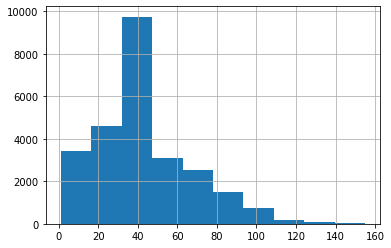

<AxesSubplot:>

In [0]:
# Look at Wind speed data
pd_df["WND_SPD"].hist()

Out[251]:

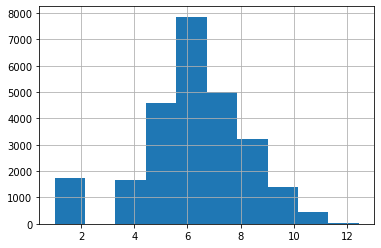

<AxesSubplot:>

In [0]:
# Normalize wind speed data
pd_df["WND_SPD"] = np.sqrt(pd_df["WND_SPD"])
pd_df["WND_SPD"].hist()

### Freezing Level

In [0]:
# Get the temperature in celsius
pd_df["TMP_C"] = pd_df["TMP"].str.split(",", expand=True)[0].astype(int)/10

# Remove missing temperatures
pd_df = pd_df.loc[pd_df["TMP_C"] != 999.9]

Out[253]:

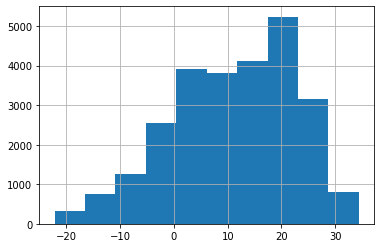

<AxesSubplot:>

In [0]:
# Current temperature histogram
pd_df["TMP_C"].hist()

In [0]:
# Get the dew point in celsius
pd_df["DEW_C"] = pd_df["DEW"].str.split(",", expand=True)[0].astype(int)/10

# Remove missing dew point
pd_df = pd_df.loc[pd_df["DEW_C"] != 999.9]

Out[255]:

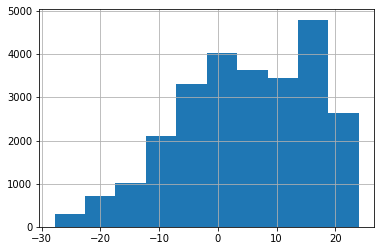

<AxesSubplot:>

In [0]:
# Current dewpoint histogram
pd_df["DEW_C"].hist()

In [0]:
# Create variable for the freezing level in feet
pd_df["freezing_level"] = ((pd_df["TMP_C"] - pd_df["DEW_C"])*500)

Out[257]:

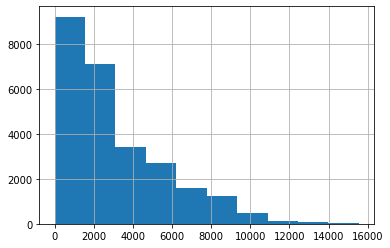

<AxesSubplot:>

In [0]:
# Visualize freezing level
pd_df["freezing_level"].hist()

### Cloud Base

In [0]:
# Extract cloud base in meters
pd_df["cloud_base"] = pd_df["CIG"].str.split(",", expand=True)[0].astype(int)

# Remove missing clouds
pd_df = pd_df.loc[pd_df["cloud_base"] != 99999]

# Convert Cloud base from meters to feet
pd_df["cloud_base"] = pd_df["cloud_base"]*3.281

Out[259]:

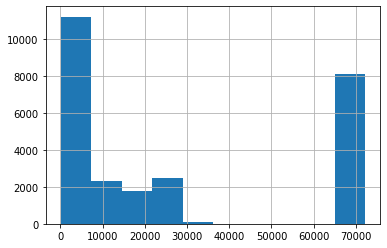

<AxesSubplot:>

In [0]:
pd_df["cloud_base"].hist()

In [0]:
pd_df["clouds_over_freezing"] = pd_df["cloud_base"] - pd_df["freezing_level"]

### Basic Modeling

In [0]:
# Sort training data by day
train_df = pd_df.sort_values("FL_DATE").reset_index()

In [0]:
# Split training and testing data by day
train = train_df[:18069]
test = train_df[18069:]

In [0]:
train.tail()

Out[290]:

,index,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,...,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,obs_hour,plain_date,plain_call_sign,WND_SPD,TMP_C,DEW_C,freezing_level,cloud_base,clouds_over_freezing
18064,8705,2015,2,5,7,4,2015-05-07,F9,20436,F9,N204FR,1263,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12889,1288903,32211,LAS,"Las Vegas, NV",NV,32,Nevada,85,830,921.0,51.0,51.0,1.0,3.0,0800-0859,17.0,938.0,1113.0,...,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,08,2015-05-07,ORD,5.196152,12.2,9.4,1400.0,72182.0,70782.0
18065,8702,2015,2,5,7,4,2015-05-07,UA,19977,UA,N802UA,464,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14122,1412202,30198,PIT,"Pittsburgh, PA",PA,42,Pennsylvania,23,2057,2106.0,9.0,9.0,0.0,0.0,2000-2059,29.0,2135.0,2332.0,...,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,08,2015-05-07,ORD,5.196152,12.2,9.4,1400.0,72182.0,70782.0
18066,8703,2015,2,5,7,4,2015-05-07,MQ,20398,MQ,N698MQ,3351,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,11274,1127402,31274,DBQ,"Dubuque, IA",IA,19,Iowa,61,2035,2029.0,-6.0,0.0,0.0,-1.0,2000-2059,16.0,2045.0,2116.0,...,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,08,2015-05-07,ORD,5.196152,12.2,9.4,1400.0,72182.0,70782.0
18067,8699,2015,2,5,7,4,2015-05-07,MQ,20398,MQ,N918MQ,3549,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14524,1452401,34524,RIC,"Richmond, VA",VA,51,Virginia,38,1510,1506.0,-4.0,0.0,0.0,-1.0,1500-1559,20.0,1526.0,1804.0,...,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,03,2015-05-07,ORD,5.196152,13.3,10.0,1650.0,72182.0,70532.0
18068,8704,2015,2,5,7,4,2015-05-07,MQ,20398,MQ,N686MQ,3250,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,15096,1509602,35096,SYR,"Syracuse, NY",NY,36,New York,22,839,834.0,-5.0,0.0,0.0,-1.0,0800-0859,8.0,842.0,1103.0,...,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,08,2015-05-07,ORD,5.196152,12.2,9.4,1400.0,72182.0,70782.0


In [0]:
test.head()

Out[291]:

,index,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,...,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3,obs_hour,plain_date,plain_call_sign,WND_SPD,TMP_C,DEW_C,freezing_level,cloud_base,clouds_over_freezing
18069,8824,2015,2,5,8,5,2015-05-08,MQ,20398,MQ,N509MQ,3678,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,13230,1323002,32070,MDT,"Harrisburg, PA",PA,42,Pennsylvania,23,1500,1502.0,2.0,2.0,0.0,0.0,1500-1559,92.0,1634.0,1852.0,...,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,03,2015-05-08,ORD,6.082763,23.3,17.8,2750.0,25001.220,22251.220
18070,8825,2015,2,5,8,5,2015-05-08,EV,20366,EV,N13969,5918,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,11042,1104203,30647,CLE,"Cleveland, OH",OH,39,Ohio,44,1529,1844.0,195.0,195.0,1.0,12.0,1500-1559,29.0,1913.0,2108.0,...,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,03,2015-05-08,ORD,6.082763,23.3,17.8,2750.0,25001.220,22251.220
18071,8826,2015,2,5,8,5,2015-05-08,UA,19977,UA,N827UA,395,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14679,1467903,33570,SAN,"San Diego, CA",CA,6,California,91,1625,1728.0,63.0,63.0,1.0,4.0,1600-1659,36.0,1804.0,1957.0,...,,,,,,,,,,,,,,,,"3,99,1,+07620,1,9",,,,,,,,,,,,,,,,04,2015-05-08,ORD,5.656854,23.9,17.8,3050.0,16001.437,12951.437
18072,8827,2015,2,5,8,5,2015-05-08,AA,19805,AA,N3LFAA,2239,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,11278,1127802,30852,DCA,"Washington, DC",VA,51,Virginia,38,1630,1626.0,-4.0,0.0,0.0,-1.0,1600-1659,92.0,1758.0,2020.0,...,,,,,,,,,,,,,,,,"3,99,1,+07620,1,9",,,,,,,,,,,,,,,,04,2015-05-08,ORD,5.656854,23.9,17.8,3050.0,16001.437,12951.437
18073,8828,2015,2,5,8,5,2015-05-08,AA,19805,AA,N3MEAA,111,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12892,1289203,32575,LAX,"Los Angeles, CA",CA,6,California,91,1655,1858.0,123.0,123.0,1.0,8.0,1600-1659,28.0,1926.0,2125.0,...,,,,,,,,,,,,,,,,"3,99,1,+07620,1,9",,,,,,,,,,,,,,,,04,2015-05-08,ORD,5.656854,23.9,17.8,3050.0,16001.437,12951.437


In [0]:
# Train-test split
train.shape[0]/train_df.shape[0]

Out[263]: 0.6963274114609426

In [0]:
train_cols = [
  "WND_SPD",
  "TMP_C",
  "DEW_C"
]

In [0]:
# Instantiate and train model
lr = LogisticRegressionCV()
lr.fit(train[train_cols], train["DEP_DEL15"])

Out[327]: LogisticRegressionCV()

In [0]:
# Score model with default
train_score = lr.score(train[train_cols], train["DEP_DEL15"])
test_score = lr.score(test[train_cols], test["DEP_DEL15"])

print(f"Model Training Accuracy: {train_score}")
print(f"Model Testing Accuracy: {test_score}")

Model Training Accuracy: 0.7437046875864741
Model Testing Accuracy: 0.7163705583756346

In [0]:
lr.predict(train[train_cols]).mean()

Out[332]: 0.015662183850794178